## Contact: Ekin Ugurel 
### Email: ugurel [at] uw [dot] edu
### Website: ekinugurel.github.io

* Special thanks to Eric Gagliano for providing the functions and examples for the notebook.

In [24]:
%pip install censusdata geopandas matplotlib folium mapclassify

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.1/85.1 kB 4.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [25]:
import censusdata
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

### Helper functions to get census data

In [6]:
def get_census_data(tables, state, county, year=2022):

    # Download the data
    data = censusdata.download('acs5', year,  # Use 2022 ACS 5-year estimates
                               censusdata.censusgeo([('state', state), ('county', county), ('tract', '*'), ('block group', '*')]),
                               list(tables.keys()))

    # Rename the column
    data.rename(columns=tables, inplace=True)

    # Extract information from the first column
    data['Name'] = data.index.to_series().apply(lambda x: x.name)
    data['SummaryLevel'] = data.index.to_series().apply(lambda x: x.sumlevel())
    data['State'] = data.index.to_series().apply(lambda x: x.geo[0][1])
    data['County'] = data.index.to_series().apply(lambda x: x.geo[1][1])
    data['Tract'] = data.index.to_series().apply(lambda x: x.geo[2][1])
    data.reset_index(drop=True, inplace=True)
    data = data[['Tract','Name']+list(tables.values())].set_index('Tract')
    return data

def get_census_tract_geom(state_fips, county_fips):

    # find state and county fips here: https://www.census.gov/geographies/reference-files/2017/demo/popest/2017-fips.html
    
    # Download the census tract shapefiles
    tracts = gpd.read_file(f'https://www2.census.gov/geo/tiger/TIGER2022/TRACT/tl_2022_{state_fips}_tract.zip')

    # set index as tract
    tracts = tracts.rename(columns={'TRACTCE':'Tract'}).set_index('Tract')

    # Filter to only King County
    tracts = tracts[tracts['COUNTYFP'] == county_fips]
    tracts = tracts[['geometry']]

    return tracts

def convert_to_percentages(df, total_population_column='TotalPopulation'):
    for column in df.columns:
        if column.startswith('Population'):
            new_column_name = 'Percent' + column
            df[new_column_name] = (df[column] / df[total_population_column]) * 100
            df.drop(column, axis=1, inplace=True)
    return df

### Define our areas of interest
- Both functions will require Federal Information Processing System (FIPS) codes that identify geographic areas
- Can find more here: https://www.census.gov/geographies/reference-files/2017/demo/popest/2017-fips.html

In [7]:
# Define the state and county for Seattle
state_fips = '53'  # FIPS code for Washington
county_fips = '033'  # FIPS code for King County
#county_fips = '053'  # FIPS code for Pierce County

In [8]:
tables = {
'B19013_001E': 'MedianIncome',
'B19013_001M': 'MedianIncome - MoE',
'B01003_001E': 'TotalPopulation',
'B01003_001M': 'TotalPopulation - MoE',
'B01002_001E': 'MedianAge',
'B01002_001M': 'MedianAge - MoE',
'B17001_002E': 'PopulationBelowPovertyLevel',
'B17001_002M': 'PopulationBelowPovertyLevel - MoE',
'B02001_002E': 'PopulationWhiteAlone',
'B02001_003E': 'PopulationBlackAlone',
'B02001_004E': 'PopulationAmericanIndianAlaskaNativeAlone',
'B02001_005E': 'PopulationAsianAlone',
'B02001_006E': 'PopulationNativeHawaiianPacificIslanderAlone',
'B02001_007E': 'PopulationSomeOtherRaceAlone',
'B02001_008E': 'PopulationTwoOrMoreRaces',
'B03002_003E': 'PopulationNotHispanicWhiteAlone',
'B03003_003E': 'PopulationHispanic',
'B25064_001E': 'MedianGrossRent',
'B25077_001E': 'MedianHomeValue',
'B25035_001E': 'MedianYearStructureBuilt',
'B25001_001E': 'TotalHousingUnits',
'B25004_001E': 'TotalVacantHousingUnits',
'B25003_002E': 'OccupiedHousingUnitsOwnerOccupied',
'B25003_003E': 'OccupiedHousingUnitsRenterOccupied',
'B27001_005E': 'PopulationNoHealthInsuranceCoverage',
}

In [9]:
# Download the data
data = censusdata.download('acs5', 2022,  # Use 2022 ACS 5-year estimates
                            censusdata.censusgeo([('state', state_fips), ('county', county_fips), ('tract', '*'), ('block group', '*')]),
                            list(tables.keys()))

In [10]:
census_data = get_census_data(tables, state_fips, county_fips)
census_data.head()

,Name,MedianIncome,MedianIncome - MoE,TotalPopulation,TotalPopulation - MoE,MedianAge,MedianAge - MoE,PopulationBelowPovertyLevel,PopulationBelowPovertyLevel - MoE,PopulationWhiteAlone,...,PopulationNotHispanicWhiteAlone,PopulationHispanic,MedianGrossRent,MedianHomeValue,MedianYearStructureBuilt,TotalHousingUnits,TotalVacantHousingUnits,OccupiedHousingUnitsOwnerOccupied,OccupiedHousingUnitsRenterOccupied,PopulationNoHealthInsuranceCoverage
Tract,,,,,,,,,,,,,,,,,,,,,
000101,Block Group 1; Census Tract 1.01; King County;...,101354,25070,1361,634,32.0,5.8,None,None,950,...,928,46,1914,1007100,2013,917,215,68,634,None
000101,Block Group 2; Census Tract 1.01; King County;...,49000,15594,1127,348,33.7,5.4,None,None,451,...,430,113,1554,-666666666,1983,582,0,43,539,None
000101,Block Group 3; Census Tract 1.01; King County;...,62841,18640,911,340,30.4,1.6,None,None,199,...,199,134,1924,671900,1984,473,47,33,393,None
000102,Block Group 1; Census Tract 1.02; King County;...,182885,73318,1995,715,45.4,11.7,None,None,1860,...,1860,11,2407,1095200,1962,689,15,523,151,None
000102,Block Group 2; Census Tract 1.02; King County;...,84291,22225,1107,403,36.8,5.5,None,None,675,...,637,197,2372,723200,1949,476,0,318,158,None


In [12]:
tract_geom_gdf = get_census_tract_geom(state_fips, county_fips).to_crs('EPSG:4326') # or gpd.read_file('tl_2019_53_tract.zip')
tract_geom_gdf.head()

,geometry
Tract,
005304,"POLYGON ((-122.31834 47.65537, -122.31822 47.6..."
032221,"POLYGON ((-122.00658 47.53659, -122.00655 47.5..."
032223,"POLYGON ((-122.02531 47.56653, -122.02527 47.5..."
005901,"POLYGON ((-122.37622 47.65533, -122.37622 47.6..."
024904,"POLYGON ((-122.16584 47.55675, -122.16582 47.5..."


In [13]:
# format census data, change dtype of Tract so that it matches census_data
census_data = census_data.reset_index()
census_data['Tract'] = census_data['Tract'].astype('object')

In [14]:
census_data_geoms = census_data.merge(tract_geom_gdf, on='Tract', how='left')
census_data_geoms.head()

,Tract,Name,MedianIncome,MedianIncome - MoE,TotalPopulation,TotalPopulation - MoE,MedianAge,MedianAge - MoE,PopulationBelowPovertyLevel,PopulationBelowPovertyLevel - MoE,...,PopulationHispanic,MedianGrossRent,MedianHomeValue,MedianYearStructureBuilt,TotalHousingUnits,TotalVacantHousingUnits,OccupiedHousingUnitsOwnerOccupied,OccupiedHousingUnitsRenterOccupied,PopulationNoHealthInsuranceCoverage,geometry
0,000101,Block Group 1; Census Tract 1.01; King County;...,101354,25070,1361,634,32.0,5.8,None,None,...,46,1914,1007100,2013,917,215,68,634,None,"POLYGON ((-122.29654 47.73198, -122.29653 47.7..."
1,000101,Block Group 2; Census Tract 1.01; King County;...,49000,15594,1127,348,33.7,5.4,None,None,...,113,1554,-666666666,1983,582,0,43,539,None,"POLYGON ((-122.29654 47.73198, -122.29653 47.7..."
2,000101,Block Group 3; Census Tract 1.01; King County;...,62841,18640,911,340,30.4,1.6,None,None,...,134,1924,671900,1984,473,47,33,393,None,"POLYGON ((-122.29654 47.73198, -122.29653 47.7..."
3,000102,Block Group 1; Census Tract 1.02; King County;...,182885,73318,1995,715,45.4,11.7,None,None,...,11,2407,1095200,1962,689,15,523,151,None,"POLYGON ((-122.2964 47.72651, -122.29461 47.72..."
4,000102,Block Group 2; Census Tract 1.02; King County;...,84291,22225,1107,403,36.8,5.5,None,None,...,197,2372,723200,1949,476,0,318,158,None,"POLYGON ((-122.2964 47.72651, -122.29461 47.72..."


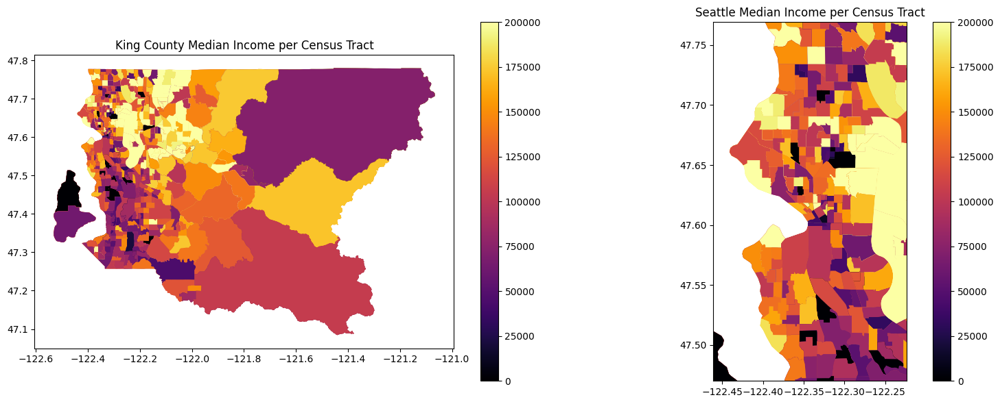

In [15]:
# Convert to geodataframe
census_data_geoms_gdf = gpd.GeoDataFrame(census_data_geoms, crs='EPSG:4326', geometry=census_data_geoms.geometry)

# Remove tracts with no population
census_data_geoms_gdf = census_data_geoms_gdf[census_data_geoms_gdf.TotalPopulation > 0]

# Plot the data
f, ax = plt.subplots(1,2,figsize=(15,6))
# king county
king_plot = census_data_geoms_gdf.plot(column='MedianIncome', cmap='inferno', legend=True, ax=ax[0], vmax=200000, vmin=0)
ax[0].set_title("King County Median Income per Census Tract")

# just seattle
census_data_geoms_gdf.plot(column='MedianIncome', cmap='inferno', legend=True, ax=ax[1], vmax=200000, vmin=0)
ax[1].set_title("Seattle Median Income per Census Tract")
# obtain bounding box coordinates from bboxfinder.com
ax[1].set_xlim([-122.4611, -122.2234])
ax[1].set_ylim([47.4701, 47.7691])

plt.tight_layout()

In [16]:
census_data_geoms_gdf['RatioMedianGrossRentToIncome'] = census_data_geoms_gdf['MedianGrossRent']/census_data_geoms_gdf['MedianIncome']
census_data_geoms_gdf['PercentRented'] = census_data_geoms_gdf['OccupiedHousingUnitsRenterOccupied']/census_data_geoms_gdf['TotalHousingUnits']
census_data_geoms_gdf['PercentOwned'] = census_data_geoms_gdf['OccupiedHousingUnitsOwnerOccupied']/census_data_geoms_gdf['TotalHousingUnits']
census_data_geoms_gdf['PopulationNonWhite'] = census_data_geoms_gdf['TotalPopulation'] - census_data_geoms_gdf['PopulationNotHispanicWhiteAlone']
census_data_geoms_gdf.head()

,Tract,Name,MedianIncome,MedianIncome - MoE,TotalPopulation,TotalPopulation - MoE,MedianAge,MedianAge - MoE,PopulationBelowPovertyLevel,PopulationBelowPovertyLevel - MoE,...,TotalHousingUnits,TotalVacantHousingUnits,OccupiedHousingUnitsOwnerOccupied,OccupiedHousingUnitsRenterOccupied,PopulationNoHealthInsuranceCoverage,geometry,RatioMedianGrossRentToIncome,PercentRented,PercentOwned,PopulationNonWhite
0,000101,Block Group 1; Census Tract 1.01; King County;...,101354,25070,1361,634,32.0,5.8,None,None,...,917,215,68,634,None,"POLYGON ((-122.29654 47.73198, -122.29653 47.7...",0.018884,0.691385,0.074155,433
1,000101,Block Group 2; Census Tract 1.01; King County;...,49000,15594,1127,348,33.7,5.4,None,None,...,582,0,43,539,None,"POLYGON ((-122.29654 47.73198, -122.29653 47.7...",0.031714,0.926117,0.073883,697
2,000101,Block Group 3; Census Tract 1.01; King County;...,62841,18640,911,340,30.4,1.6,None,None,...,473,47,33,393,None,"POLYGON ((-122.29654 47.73198, -122.29653 47.7...",0.030617,0.830867,0.069767,712
3,000102,Block Group 1; Census Tract 1.02; King County;...,182885,73318,1995,715,45.4,11.7,None,None,...,689,15,523,151,None,"POLYGON ((-122.2964 47.72651, -122.29461 47.72...",0.013161,0.219158,0.759071,135
4,000102,Block Group 2; Census Tract 1.02; King County;...,84291,22225,1107,403,36.8,5.5,None,None,...,476,0,318,158,None,"POLYGON ((-122.2964 47.72651, -122.29461 47.72...",0.028141,0.331933,0.668067,470


In [17]:
census_data_gdf = convert_to_percentages(census_data_geoms_gdf)
census_data_gdf.head()

,Tract,Name,MedianIncome,MedianIncome - MoE,TotalPopulation,TotalPopulation - MoE,MedianAge,MedianAge - MoE,MedianGrossRent,MedianHomeValue,...,PercentPopulationBlackAlone,PercentPopulationAmericanIndianAlaskaNativeAlone,PercentPopulationAsianAlone,PercentPopulationNativeHawaiianPacificIslanderAlone,PercentPopulationSomeOtherRaceAlone,PercentPopulationTwoOrMoreRaces,PercentPopulationNotHispanicWhiteAlone,PercentPopulationHispanic,PercentPopulationNoHealthInsuranceCoverage,PercentPopulationNonWhite
0,000101,Block Group 1; Census Tract 1.01; King County;...,101354,25070,1361,634,32.0,5.8,1914,1007100,...,1.836885,2.204262,14.033799,0.0,0.000000,12.123439,68.185158,3.379868,NaN,31.814842
1,000101,Block Group 2; Census Tract 1.01; King County;...,49000,15594,1127,348,33.7,5.4,1554,-666666666,...,38.598048,0.000000,9.849157,0.0,8.163265,3.371783,38.154392,10.026619,NaN,61.845608
2,000101,Block Group 3; Census Tract 1.01; King County;...,62841,18640,911,340,30.4,1.6,1924,671900,...,6.476400,0.000000,40.065862,0.0,6.366630,25.246981,21.844127,14.709111,NaN,78.155873
3,000102,Block Group 1; Census Tract 1.02; King County;...,182885,73318,1995,715,45.4,11.7,2407,1095200,...,0.000000,0.000000,5.563910,0.0,1.203008,0.000000,93.233083,0.551378,NaN,6.766917
4,000102,Block Group 2; Census Tract 1.02; King County;...,84291,22225,1107,403,36.8,5.5,2372,723200,...,2.529359,0.000000,18.608853,0.0,14.363144,3.523035,57.542909,17.795845,NaN,42.457091


In [20]:
# Save as dataframe
census_data_preprocessed = pd.DataFrame(census_data_gdf)

# Save to CSV
#census_data_preprocessed.to_csv('data/king_county_census_data_preprocessed.csv', index=False)

In [26]:
# Exploratory plot, make it more transparent
census_data_geoms_gdf.explore(column='PercentPopulationNonWhite', 
                              vmin=0, 
                              vmax=100, 
                              cmap='inferno', 
                              style_kwds=dict(color="black",weight=1, opacity=0.2, fillOpacity=.4))

In [22]:
census_data_geoms_gdf.corr(numeric_only=True)

,MedianIncome,MedianIncome - MoE,TotalPopulation,TotalPopulation - MoE,MedianAge,MedianAge - MoE,MedianGrossRent,MedianHomeValue,MedianYearStructureBuilt,TotalHousingUnits,...,PercentPopulationWhiteAlone,PercentPopulationBlackAlone,PercentPopulationAmericanIndianAlaskaNativeAlone,PercentPopulationAsianAlone,PercentPopulationNativeHawaiianPacificIslanderAlone,PercentPopulationSomeOtherRaceAlone,PercentPopulationTwoOrMoreRaces,PercentPopulationNotHispanicWhiteAlone,PercentPopulationHispanic,PercentPopulationNonWhite
MedianIncome,1.000000,0.481085,0.093313,0.011790,0.041637,-0.054681,-0.004462,0.101041,0.131702,0.038185,...,0.054145,-0.100358,-0.005447,0.008812,-0.030514,0.001683,-0.026290,0.054566,0.006426,-0.054566
MedianIncome - MoE,0.481085,1.000000,0.017754,0.030242,-0.056867,0.016752,0.125135,-0.001261,0.091210,0.101154,...,0.024144,0.029681,0.029569,-0.105899,0.024998,0.074864,0.023808,0.012288,0.116222,-0.012288
TotalPopulation,0.093313,0.017754,1.000000,0.654203,-0.214574,-0.186426,0.103112,0.043488,0.005825,0.574534,...,-0.170793,0.110506,-0.056813,0.069710,0.062549,0.118365,0.065428,-0.174494,0.120951,0.174494
TotalPopulation - MoE,0.011790,0.030242,0.654203,1.000000,-0.243470,0.063893,0.009725,-0.018646,0.031522,0.289070,...,-0.225381,0.181737,-0.026944,0.024161,0.084588,0.194316,0.129802,-0.230844,0.217305,0.230844
MedianAge,0.041637,-0.056867,-0.214574,-0.243470,1.000000,0.310858,-0.228294,0.251755,0.050321,-0.139349,...,0.330480,-0.192502,-0.048134,-0.124468,-0.111051,-0.200001,-0.157103,0.345088,-0.244148,-0.345088
MedianAge - MoE,-0.054681,0.016752,-0.186426,0.063893,0.310858,1.000000,-0.093352,0.094783,0.012523,-0.137254,...,0.052636,0.053988,0.034617,-0.132536,0.062104,0.052337,-0.030491,0.054146,0.032914,-0.054146
MedianGrossRent,-0.004462,0.125135,0.103112,0.009725,-0.228294,-0.093352,1.000000,-0.097694,0.070323,0.305753,...,-0.168895,0.131949,0.007440,0.056791,0.082067,0.128108,0.013806,-0.175691,0.118970,0.175691
MedianHomeValue,0.101041,-0.001261,0.043488,-0.018646,0.251755,0.094783,-0.097694,1.000000,0.105999,-0.125702,...,0.175109,-0.071407,-0.016391,-0.131044,-0.046722,-0.060639,-0.035343,0.185369,-0.106834,-0.185369
MedianYearStructureBuilt,0.131702,0.091210,0.005825,0.031522,0.050321,0.012523,0.070323,0.105999,1.000000,0.112701,...,0.000187,0.030382,0.019889,-0.044376,0.014435,0.031834,0.008986,0.003107,0.015135,-0.003107
TotalHousingUnits,0.038185,0.101154,0.574534,0.289070,-0.139349,-0.137254,0.305753,-0.125702,0.112701,1.000000,...,-0.053334,0.046497,-0.069774,0.054528,-0.013537,0.004378,-0.003358,-0.051862,0.005826,0.051862


In [29]:
# Remove median incomes that are negative from census_data_geoms_gdf
census_data_geoms_gdf = census_data_geoms_gdf[census_data_geoms_gdf['MedianIncome'] > 0]

Text(0.5, 1.0, 'Relationship between non-white population, median age, and median income in a census tract')

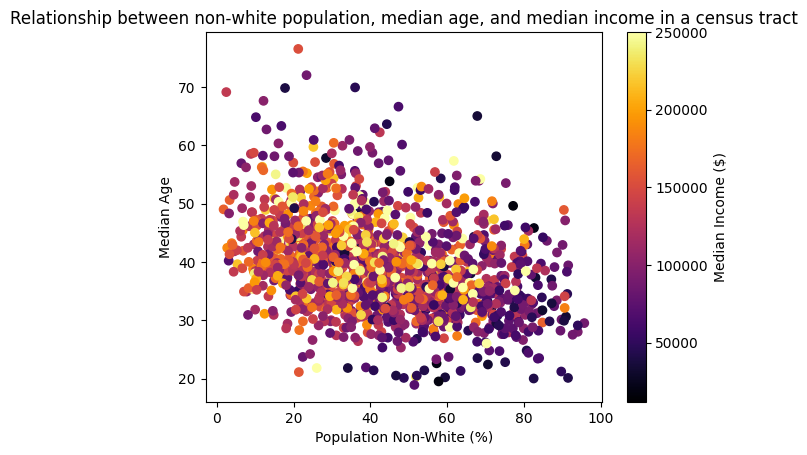

In [30]:
scatterplot = plt.scatter(census_data_geoms_gdf.PercentPopulationNonWhite, census_data_geoms_gdf.MedianAge, c=census_data_geoms_gdf.MedianIncome, cmap='inferno')
plt.xlabel("Population Non-White (%)")
plt.ylabel("Median Age")
plt.colorbar(scatterplot, label='Median Income ($)')
plt.title("Relationship between non-white population, median age, and median income in a census tract")